In [1]:
import pandas as pd
import numpy as np
import config
import datetime
from sqlalchemy import text
import plotly
import plotly.express as px
import ipywidgets
from urllib.request import urlopen
import json
import plotly.graph_objects as go
import geopandas as gpd
import warnings
import pyproj
import plotly.io as pio
import pickle
print(config.version)
print(config.connection_string)
print(plotly.__version__, ipywidgets.__version__, pd.__version__, np.__version__)
pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore', category=UserWarning) 


3.2.0.Dev
postgresql://postgres:sa@localhost/icip
6.3.1 8.1.7 2.0.0 1.26.4


In [2]:
# gdf = gpd.read_file("../data/iris/contours-iris.gpkg")
# gdf = gdf.to_crs(epsg=4326)
# gdf["fid"] = gdf.index
# gdf["lon"] = gdf.geometry.centroid.x
# gdf["lat"] = gdf.geometry.centroid.y
# gdf = gdf.sort_values(by="code_iris")
# with open("../data/iris/gdf.pickle", "wb") as f:
#     pickle.dump(gdf, f)
with open("../data/iris/gdf.pickle", "rb") as f:
    gdf_france = pickle.load(f)
    geojson=gdf_france.__geo_interface__
    len(gdf_france)

In [146]:
years = list(range(13,25))
spe_df = pd.read_sql("select * from sae.bor order by id", config.connection_string, index_col="id")
spe_df

,label,table,column,condition
id,,,,
1,Urgences générales - entrées,urgence_detail,passu/1000::float,urg='GEN'
2,Urgences pédiatriques - entrées,urgence_detail,passu/1000::float,urg='PED'
3,Urgences générales - ETP,urgence_p,etpsal,perso='M9999'
4,Etablissement psychiatrique - ETP,psy,etpsal_pkt,dis='TOT'


Documentation

code_commune: il y a plusieurs possibilités :
* le code de la commune sur 5 chiffres, par exemple "06088" pour Nice
* certains anciens code commune sont acceptés comme 75101 pour Paris 1er arrondissement
* le département sur 2 chiffres, par exemple "06"
* le code IRIS sur 9 chiffres, par exemple "382050000"
* une liste de code IRIS entre crochet, par exemple \["385480000", "382050000"]
* une liste de code commune entre crochet, par exemple \["38548", "38205"]
* le code IRIS avec un joker sql de type "3820%"
* pour la corse utiliser les préfixes 2A ou 2B et non 20, par exemple "2A004"

bor: voir tableau ci dessus

time: 30 ou 45, il est possible d'en faire d'autre mais il faut lancer les calculs

time_type: "HC" ou "HP"

aexp: -0.12 ou -0.1 ou -0.08 ou -0.06 ou -0.04<br>
Pour time==30 aexp: -0.12 ou -0.1 ou -0.08<br>
Pour time==45 aexp: -0.08 ou -0.06<br>
Pour time==60 aexp: -0.06 ou -0.04

norm_colorbar = True si normalisé sur France entière False sinon

meanw_colorbar = True si normalisé sur moyenne pondérée, False si normalisé sur Médiane

Pour ne plus voir les labels sur les IRIS mettre limit_show=0

Puis appuyer sur le bouton Restart (bouton avec double flèche à droite FFW) ou dans le menu Run / Run selected cell and all below

In [147]:
code_commune="06088" #"75101" #"75056" #"69123" #"38185"  #"06088" "38205" "38548" "2A004" "382050000" ["385480000", "382050000"] ["38548", "38205"] "45" "14581" bug
bor = 3
time=30 # 30 or 45
time_type="HC" # HC or HP
aexp=-0.12 # -0.12 or -0.1 or -0.08 or -0.06 or -0.04
norm_colorbar=True
meanw_colorbar=True
limit_show_label=0
code_commune,bor,source,time,time_type,aexp,norm_colorbar,meanw_colorbar

('06088', 3, 'PA', 30, 'HC', -0.12, True, True)

In [148]:
if type(code_commune) is list:
    if len(code_commune[0])==5:
        type_code="CLIST"
    elif  len(code_commune[0])==9:
        type_code = "ILIST"
    else:
        raise ValueError(f"Bad {code_commune}")    
elif "%" in code_commune and len(code_commune) > 2:
    type_code = "LIKE"
elif len(code_commune) == 2:
    type_code = "LIKE"
    code_commune = code_commune + "%"
elif len(code_commune) == 5:
    type_code = "COM"
elif len(code_commune) == 9:
    type_code = "IRIS"
else:
    raise ValueError(f"Bad {code_commune}")
print(f"Type code: {type_code}")

Type code: COM


In [149]:
sql = f"""
select i.*, c.nom commune_nom from iris.commune c
join iris.iris i on i.commune_id=c.id
where c.code='{code_commune}'
order by i.id
"""
commune_nom = None
if type_code=="COM":
    iris_df = pd.read_sql(sql, config.connection_string)
    iriss = iris_df["code"].values
    commune_nom = iris_df["commune_nom"].iloc[0] if len(iris_df) > 0 else None
elif type_code in ["IRIS", "LIKE"]:
    iriss = [code_commune]
elif type_code == "ILIST":
    iriss = code_commune
elif type_code == "CLIST":
    sql = f"""
select i.*, c.nom commune_nom from iris.commune c
join iris.iris i on i.commune_id=c.id
where c.code in {tuple(code_commune)}
"""
    print(sql)
    iris_df = pd.read_sql(sql, config.connection_string)
    iriss = iris_df["code"].values
    commune_nom = iris_df["commune_nom"].iloc[0] if len(iris_df) > 0 else None
print(f"Found {len(iriss)} iris for {commune_nom}")

if type_code == "LIKE":
    gdf = gdf_france[gdf_france["code_iris"].str.startswith(code_commune[:-1])]
elif len(iriss)>0:
    gdf = gdf_france[gdf_france["code_iris"].isin(iriss)]
else:
    gdf = gdf_france[gdf_france["code_insee"]==code_commune]
    type_code="INSEE"
if commune_nom is None:
    commune_nom=gdf["nom_commune"].iloc[0] if len(gdf) > 0 else None
    print(f"Found {len(gdf)} iris in {commune_nom}")
geojson=gdf.__geo_interface__
print(f"Found {len(gdf)} geo iris for {commune_nom}, type_code: {type_code}")
# gdf_france[gdf_france["nom_commune"].str.startswith("Lyon")].head(100)
gdf.head(2)

Found 146 iris for Nice
Found 146 geo iris for Nice, type_code: COM


,cleabs,code_insee,nom_commune,iris,code_iris,nom_iris,type_iris,geometry,fid,lon,lat
2597,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476
4458,IRIS____0000000060880102,06088,Nice,0102,060880102,Vieux Nice-Sainte-Réparate,H,"MULTIPOLYGON (((7.27454 43.69773, 7.27598 43.6...",4458,7.275641,43.697293


In [150]:
def get_study_by_year(year):
    sql = f"""
    select * from sae.saeapl_study s
    where s.bor_id={bor}
    and s.year=20{year}
    and s.time={time}
    and s.time_type='{time_type}'
    and s.exp={aexp}
    order by date desc
    limit 1
    """
    return pd.read_sql(sql, config.connection_string)

def get_studies_by_years(years: list[int]):
    df = None
    for year in years:
        if df is None:
            df = get_study_by_year(year)
        else:
            df = pd.concat([df, get_study_by_year(year)], ignore_index=True)
    return df
        
        
    
studies_df = get_studies_by_years(years)
studies_df

,year,bor_id,time,time_type,exp,mean,std,q10,q25,q50,q75,q90,min,max,date,key,meanw
0,2013,3,30,HC,-0.12,6.015327,6.880039,0.0,1.377880,4.297533,8.779803,12.996356,0.0,189.204477,2025-12-05 16:20:10.975934,618347524584,8.060381
1,2014,3,30,HC,-0.12,5.986956,7.000059,0.0,1.441198,4.229100,8.671314,12.765343,0.0,212.548708,2025-12-05 16:21:38.520949,516921182315,7.968052
2,2015,3,30,HC,-0.12,6.068255,6.817202,0.0,1.412928,4.343811,8.927090,13.355368,0.0,204.916862,2025-12-05 16:23:04.780781,923023932560,8.214265
3,2016,3,30,HC,-0.12,6.214697,6.894485,0.0,1.532587,4.549178,9.155502,13.438029,0.0,252.751009,2025-12-05 16:24:31.212031,187533621703,8.327870
4,2017,3,30,HC,-0.12,6.490212,7.424504,0.0,1.540237,4.712295,9.563859,14.033639,0.0,283.633769,2025-12-05 16:25:57.745386,801788267551,8.705872
5,2018,3,30,HC,-0.12,6.679612,7.903871,0.0,1.578581,4.786928,9.681652,14.179384,0.0,300.935417,2025-12-05 16:27:25.094986,102311867341,8.924507
6,2019,3,30,HC,-0.12,6.788297,8.034264,0.0,1.562274,4.781511,9.850988,14.730608,0.0,299.689965,2025-12-05 16:28:52.046374,639916112649,9.084930
7,2020,3,30,HC,-0.12,6.871475,8.029468,0.0,1.488056,4.764482,10.071019,15.216109,0.0,209.147241,2025-12-05 16:30:19.020781,797183911587,9.401014
8,2021,3,30,HC,-0.12,6.960024,8.174942,0.0,1.491245,4.855131,10.264571,15.159451,0.0,253.881329,2025-12-05 16:31:45.827361,778475861431,9.499486
9,2022,3,30,HC,-0.12,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,2025-12-05 16:33:16.675634,74081880465,0.000000


In [151]:
keys = studies_df["key"].values
print(f"Studies keys: {keys}")
if type_code == "COM":
    sql=f"""
    select * from sae.saeapl a
    where a.study_key in {tuple(keys)}
    and code_commune='{code_commune}'
    """
elif type_code == "IRIS":
    sql=f"""
    select * from sae.saeapl a
    where a.study_key in {tuple(keys)}
    and a.iris_string='{code_commune}'
    """
elif type_code == "LIKE":
    sql=f"""
    select * from sae.saeapl a
    where a.study_key in {tuple(keys)}
    and a.iris_string like '{code_commune}'
    """
elif type_code == "ILIST":
    sql=f"""
    select * from sae.saeapl a
    where a.study_key in {tuple(keys)}
    and a.iris_string in {tuple(code_commune)}
    """
elif type_code == "CLIST":
    sql=f"""
    select * from sae.saeapl a
    where a.study_key in {tuple(keys)}
    and a.code_commune in {tuple(code_commune)}
    """
print(sql)
apl = pd.read_sql(text(sql), config.connection_string)
if type_code == "INSEE" or len(apl) == 0:
    sql=f"""
    select * from sae.saeapl a
    where a.study_key in {tuple(keys)}
    """
    apl = pd.read_sql(sql, config.connection_string)
apl

Studies keys: [618347524584 516921182315 923023932560 187533621703 801788267551
 102311867341 639916112649 797183911587 778475861431  74081880465
 136185240198 849923060442]

    select * from sae.saeapl a
    where a.study_key in (618347524584, 516921182315, 923023932560, 187533621703, 801788267551, 102311867341, 639916112649, 797183911587, 778475861431, 74081880465, 136185240198, 849923060442)
    and code_commune='06088'
    


,year,bor,iris,iris_string,type_iris,nb,apl,ap,accessibilite_weight,R,wpop,swpop,pop_gp,pop,iris_label,dept,code_commune,commune_label,meanw,study_key
0,2014,3,60880101,060880101,A,0.0,11.141797,0.0,1.0,0.0,1261.528932,187100.953032,1261.528932,1261.528932,Saleya-Château,6,06088,Nice,10.577024,516921182315
1,2013,3,60880101,060880101,A,0.0,11.687141,0.0,1.0,0.0,1261.528932,187100.953032,1261.528932,1261.528932,Saleya-Château,6,06088,Nice,11.094724,618347524584
2,2013,3,60880102,060880102,A,0.0,13.887528,0.0,1.0,0.0,1215.033917,212730.909805,1215.033917,1215.033917,Vieux Nice-Sainte-Réparate,6,06088,Nice,12.697680,618347524584
3,2013,3,60880103,060880103,A,0.0,9.400626,0.0,1.0,0.0,2005.072251,151820.899671,2005.072251,2005.072251,Vieux Nice-Visitation,6,06088,Nice,14.183970,618347524584
4,2013,3,60880201,060880201,A,0.0,15.822228,0.0,1.0,0.0,2360.198139,233242.705782,2360.198139,2360.198139,Garibaldi,6,06088,Nice,28.101345,618347524584
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747,2022,3,60883501,060883501,A,0.0,0.000000,0.0,1.0,0.0,2649.665320,101735.468943,2649.665320,2649.665320,Crémat-Bellet,6,06088,Nice,0.000000,74081880465
1748,2022,3,60883601,060883601,A,0.0,0.000000,0.0,1.0,0.0,2930.552478,108964.921277,2930.552478,2930.552478,Saint-Pierre de Féric,6,06088,Nice,0.000000,74081880465
1749,2022,3,60883602,060883602,A,0.0,0.000000,0.0,1.0,0.0,2200.226082,134223.871488,2200.226082,2200.226082,Costière,6,06088,Nice,0.000000,74081880465
1750,2022,3,60883701,060883701,A,0.0,0.000000,0.0,1.0,0.0,3188.198432,124120.734577,3188.198432,3188.198432,Saint-Pancrace-Pessicart,6,06088,Nice,0.000000,74081880465


In [152]:
if len(apl[apl["iris_string"]=="180331201"])>0 and len(apl[apl["iris_string"]=="181740000"])>0:
    apl.loc[apl["iris_string"]=="180331201","apl"]=apl[apl["iris_string"]=="181740000"]["apl"].iloc[0]
if len(apl[apl["iris_string"]=="140110000"])>0:
    apl.loc[apl["iris_string"]=="140110000","iris_string"]="145810000"

In [153]:
apl["code_iris"]=apl["iris_string"]
gdf_merged = gdf.merge(apl, on="code_iris", how="left", suffixes=('', '_dest')).copy()
gdf_merged["pretty"]=gdf_merged["apl"].fillna(0).apply(lambda x: round(x, 0)).astype(np.int32)
gdf_merged["pop_ajustee"]=gdf_merged['pop_gp']
apl13 = gdf_merged.loc[gdf_merged['year']==2013, ['iris_dest', 'apl']].set_index('iris_dest')['apl']
gdf_merged["year13"]=gdf_merged['iris_dest'].map(apl13).fillna(0)
gdf_merged["diff13"]=gdf_merged["apl"]-gdf_merged["year13"]
gdf_merged["delta13"]=gdf_merged["diff13"]/(gdf_merged["year13"]+1e-5)
gdf_merged

,cleabs,code_insee,nom_commune,iris,code_iris,nom_iris,type_iris,geometry,fid,lon,lat,year,bor,iris_dest,iris_string,type_iris_dest,nb,apl,ap,accessibilite_weight,R,wpop,swpop,pop_gp,pop,iris_label,dept,code_commune,commune_label,meanw,study_key,pretty,pop_ajustee,year13,diff13,delta13
0,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,2014,3,60880101,060880101,A,0.0,11.141797,0.000000,1.0,0.000000,1261.528932,187100.953032,1261.528932,1261.528932,Saleya-Château,6,06088,Nice,10.577024,516921182315,11,1261.528932,11.687141,-0.545344,-0.046662
1,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,2013,3,60880101,060880101,A,0.0,11.687141,0.000000,1.0,0.000000,1261.528932,187100.953032,1261.528932,1261.528932,Saleya-Château,6,06088,Nice,11.094724,618347524584,12,1261.528932,11.687141,0.000000,0.000000
2,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,2015,3,60880101,060880101,A,0.0,12.397032,0.000000,1.0,0.000000,1261.528932,187100.953032,1261.528932,1261.528932,Saleya-Château,6,06088,Nice,11.768631,923023932560,12,1261.528932,11.687141,0.709891,0.060741
3,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,2017,3,60880101,060880101,A,0.0,12.926277,0.000000,1.0,0.000000,1261.528932,187100.953032,1261.528932,1261.528932,Saleya-Château,6,06088,Nice,12.271049,801788267551,13,1261.528932,11.687141,1.239136,0.106025
4,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,2016,3,60880101,060880101,A,0.0,12.005194,0.000000,1.0,0.000000,1261.528932,187100.953032,1261.528932,1261.528932,Saleya-Château,6,06088,Nice,11.396655,187533621703,12,1261.528932,11.687141,0.318052,0.027214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,2018,3,60883801,060883801,A,8.0,14.659917,5.678157,1.0,5.678157,2762.475513,140890.782013,2762.475513,2762.475513,Gairaut,6,06088,Nice,30.363807,102311867341,15,2762.475513,11.390144,3.269773,0.287070
1748,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,2023,3,60883801,060883801,A,0.0,9.210156,0.000000,1.0,0.000000,2685.623135,143885.361040,2685.623135,2685.623135,Gairaut,6,06088,Nice,18.347966,136185240198,9,2685.623135,11.390144,-2.179988,-0.191392
1749,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,2021,3,60883801,060883801,A,8.0,14.333982,5.559982,1.0,5.559982,2685.623135,143885.361040,2685.623135,2685.623135,Gairaut,6,06088,Nice,28.555369,778475861431,14,2685.623135,11.390144,2.943838,0.258455
1750,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,2024,3,60883801,060883801,A,0.0,0.000000,0.000000,1.0,0.000000,2685.623135,143885.361040,2685.623135,2685.623135,Gairaut,6,06088,Nice,0.000000,849923060442,0,2685.623135,11.390144,-11.390144,-0.999999


In [154]:
qmaxs = []
q90s = []
q75s = []
q50s = []
q25s = []
q10s = []
meanws = []
gdf_merged["apl_clip"]=gdf_merged["apl"]
years2000 = [y + 2000 for y in years]
for year in years2000:
    meanw = 1
    try:
        meanw = studies_df[studies_df["year"]==year]["meanw"].iloc[0]
    except:
        pass
    meanws.append(meanw)
    qmaxs.append(studies_df[studies_df["year"]==year]["max"].iloc[0] if studies_df[studies_df["year"]==year]["max"].iloc[0] != 0 else 1.0)
    if meanw_colorbar:
        q50s.append(meanw)
        q25s.append(meanw / 2)
        q10s.append(meanw / 5)
        q90s.append(meanw * 2)
        q75s.append(meanw * 1.5)
    else:
        q90=studies_df[studies_df["year"]==year]["q90"].iloc[0] if studies_df[studies_df["year"]==year]["q90"].iloc[0] != 0 else 1.0
        q90s.append(q90)
        q75=studies_df[studies_df["year"]==year]["q75"].iloc[0] if studies_df[studies_df["year"]==year]["q75"].iloc[0] != 0 else 0.0
        q75s.append(q75)
        q50=studies_df[studies_df["year"]==year]["q50"].iloc[0] if studies_df[studies_df["year"]==year]["q50"].iloc[0] != 0 else q75
        q50s.append(q50)
        q25=studies_df[studies_df["year"]==year]["q25"].iloc[0] if studies_df[studies_df["year"]==year]["q25"].iloc[0] != 0 else q50
        q25s.append(q25)
        q10s.append(studies_df[studies_df["year"]==year]["q10"].iloc[0] if studies_df[studies_df["year"]==year]["q10"].iloc[0] != 0 else q25)
    gdf_merged.loc[gdf_merged["year"]==year,"apl_clip"]=gdf_merged[gdf_merged["year"]==year]["apl"].clip(0,q90s[year-years2000[0]])
meanws

[8.060380962453792,
 7.968052149163187,
 8.214265324724341,
 8.327869606552552,
 8.705871948401816,
 8.924507362776101,
 9.084929806639984,
 9.40101401586908,
 9.49948630694491,
 0.0,
 8.914842014203023,
 0.0]

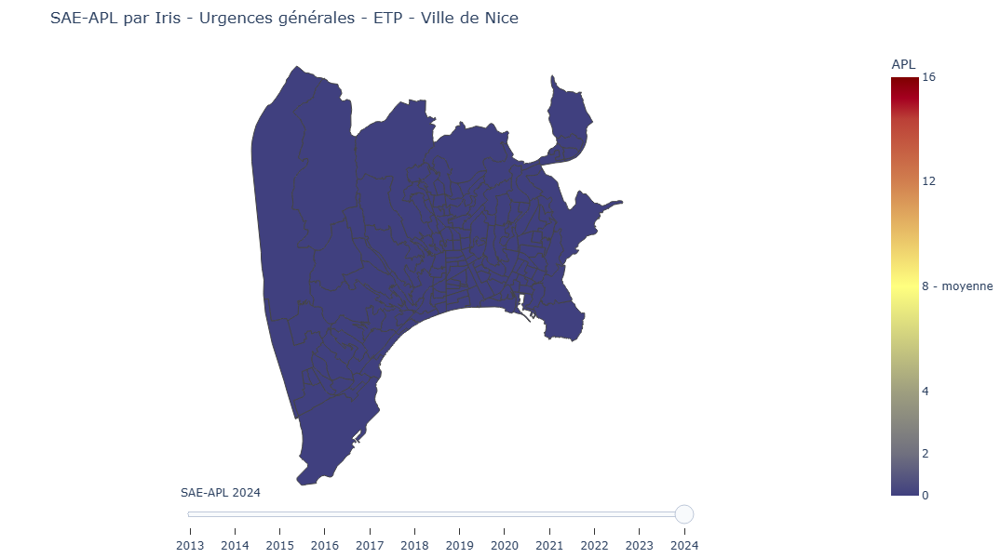

In [155]:
show_label=False
fig = go.Figure()
l=[]
l2=[]
center_lat = gdf.geometry.centroid.y.mean()
center_lon = gdf.geometry.centroid.x.mean()
for year in years2000:
    gdf_year=gdf_merged[gdf_merged["year"]==year]
    l.append(
        go.Choropleth(
            visible=False,
            geojson=geojson,
            locations=gdf_year["fid"],
            z=gdf_year["apl_clip" if norm_colorbar else "apl"],
            zmin=0,
            zmax=q90s[0] if norm_colorbar else None, # zmax=q90s[year-years[0]] if norm_colorbar else None,
            text=gdf_year.apply(
                lambda row: f"Commune: {row["nom_commune"]}<br>Iris: {row["code_iris"]}<br>Nom Iris: {row['nom_iris']}<br>SAE-APL {year}: {row['apl']:.1f}<br>Variation SAE-APL/2013: {row['delta13']*100:+.0f}%<br>{"Moyenne pondérée" if meanw_colorbar else "Médiane"} nationale SAE-APL: {(row["apl"]-q50s[year-years2000[0]])*100/(q50s[year-years2000[0]]+0.001):+.0f}% ({q50s[year-years2000[0]]:.1f})<br>Nb: {row['nb']:.1f}<br>Population: {row['pop']:.0f}<br>Population ajustée: {row['pop_ajustee']:.0f}<br>Population alentour: {row['swpop']:.0f}<br>SAE-APL local: {row['R']:.1f} ({row['R']*100/(row['apl']+1e-5):.0f}% APL)",
                axis=1
            ),
            hoverinfo="text",
            showscale=True,
            colorbar={"title": f"APL",
                      "tickvals": [0, q10s[0], q25s[0], q50s[0], q75s[0], q90s[0]] if norm_colorbar else None,
                      "ticktext": ['0', f'{q10s[0]:.0f} {"" if meanw_colorbar else "- 1er décile"}', f'{q25s[0]:.0f} {"" if meanw_colorbar else "- 1er quartile"}', f'{q50s[0]:.0f} - {"moyenne" if meanw_colorbar else "médiane"}', f'{q75s[0]:.0f} {"" if meanw_colorbar else "- 3ème quartile"}', f'{q90s[0]:.0f} {"" if meanw_colorbar else "- dernier décile"}'] if norm_colorbar else None,
                     },
            colorscale=[[0.0, "rgb(64,64,127)"],
                        [q10s[0]*1.0/q90s[0] if norm_colorbar else 0.1, "rgb(112,112,127)"],
                        [q25s[0]*1.0/q90s[0] if norm_colorbar else 0.25, "rgb(159,159,127)"],
                        [q50s[0]*1.0/q90s[0] if norm_colorbar else 0.50, "rgb(255,255,127)"],
                        [q75s[0]*1.0/q90s[0] if norm_colorbar else 0.75, "rgb(209,127,79)"],
                        [0.90, "rgb(187,64,55)"],
                        [0.95, "rgb(165,0,32)"],
                        [1.0, "rgb(127,0,0)"]
                       ]
        ))
    if show_label:
        l2.append(
            go.Scattergeo(
                lon=gdf_year["lon"],
                lat=gdf_year["lat"],
                text=gdf_year["pretty"].astype(str),
                mode="text",
                textfont=dict(color="black", size=8),
                hoverinfo="skip",
                showlegend=False,
                visible=False,
                marker=dict(
                        color='#99ff99',
                        size=8,
                        line=dict(
                            color='#006600',
                            width=2
                        )
                    ),
            ))
fig = go.Figure(data=l+l2)   
fig.data[-1].visible = True
if show_label:
    fig.data[len(l)-1].visible = True
steps = []
i=0
for year in years:
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
             ],
        label=f"20{year}",
    )
    step["args"][0]["visible"][i] = True
    if show_label:
        step["args"][0]["visible"][i+len(l)] = True
    steps.append(step)
    i+=1

sliders = [dict(
    active=len(years)-1,
    currentvalue={"prefix": "SAE-APL ", "visible":True},
    steps=steps,
    transition={'duration': 300, 'easing': 'cubic-in-out'},
    pad=dict(l=0, r=0, t=0, b=10),
    len=0.6,
    x=0.2,
    y=0.05,
)]

fig.update_layout(
    sliders=sliders,
    geo=dict(
        projection_type="mercator",
        center={"lat": center_lat, "lon": center_lon},
        fitbounds="locations",
        # center_lon=center_lon,
        # center_lat=center_lat,
        # lonaxis_range=(center_lon-0.1, center_lon+0.1),
        # lataxis_range=(center_lat-0.1, center_lat+0.1),
        showland=False,
        showcountries=False,
        showocean=False,
        showlakes=False,
        showrivers=False,
        visible=False,
    ),
    title=f"SAE-APL par Iris - {spe_df.loc[bor]["label"]} - {"Ville de" if len(code_commune) != 3 else "Département"} {commune_nom if len(code_commune) != 3 else code_commune[:-1]}",
    # height=1000,
    # width=1200,
    height=600,
    # width=2000,  
    autosize=False,
    margin=dict(l=10, r=0, t=50, b=10),
)

fig.show()

In [156]:
gdf_merged["apl"].describe().apply("{0:.0f}".format)

count    1752
mean       11
std         6
min         0
25%        10
50%        13
75%        15
max        36
Name: apl, dtype: object

In [157]:
fig.update_layout(
    height=None,
    width=None, 
    autosize=True,
    # margin=dict(l=10, r=0, t=50, b=50)
)
pio.write_html(fig, file=f"out/sae_apl_{code_commune.replace("%","")}_{time}_{time_type}_{aexp}_{'meanw' if meanw_colorbar else 'median'}{'' if norm_colorbar else '_nonorm'}_{spe_df.loc[bor].iloc[0]}.html", auto_open=True, include_plotlyjs="cdn", full_html=True, config={"responsive": True})